<a href="https://colab.research.google.com/github/VENOMDANGER2004/UCS-547-ACCELERATEDDS-/blob/main/Assignment5ADS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Q1

In [1]:
import os
import shutil
import glob

# Name of your new folder
folder_name = "/content/funny_images"

# Create the folder if it doesn't exist yet
os.makedirs(folder_name, exist_ok=True)

# Grab all the .jpg files sitting loose in the /content/ directory
jpg_files = glob.glob("/content/*.jpg")

# Move each file into the new folder
for file in jpg_files:
    shutil.move(file, folder_name)

print(f"Successfully moved {len(jpg_files)} images into the '{folder_name}' folder!")

Successfully moved 15 images into the '/content/funny_images' folder!


Metric                    | CPU Pipeline    | GPU Pipeline   
------------------------------------------------------------
Total Time                | 0.1565 s     | 0.1414 s
Average Time/Image        | 0.0104 s     | 0.0094 s
Speedup                   | -               | 1.11x


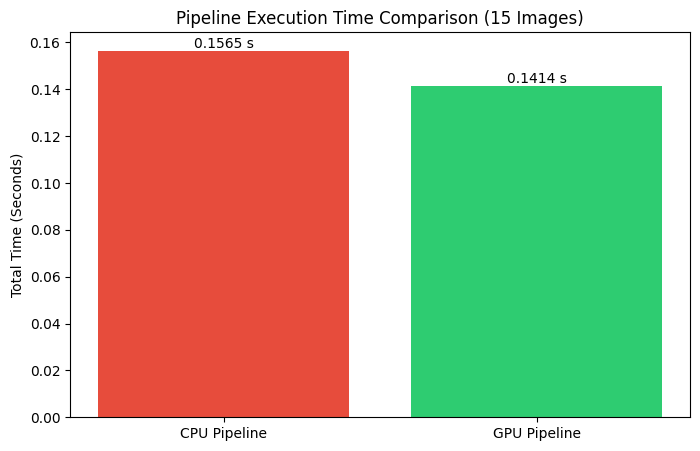

In [2]:
import cv2
import cupy as cp
import time
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Ensure this points to the folder with your 15+ images
IMAGE_DIR = "/content/funny_images/"
# Dataset of at least 15 JPEG images
image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))[:15]

def cpu_pipeline(image_path):
    """CPU-Based Pipeline"""
    # 1. Load JPEG images using OpenCV
    img = cv2.imread(image_path)
    # 2. Resize images to 512x512
    img_resized = cv2.resize(img, (512, 512))
    # 3. Convert images to grayscale
    img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    return img_gray

def gpu_pipeline(image_path):
    """GPU-Based Pipeline"""
    # 1. Decode JPEG images using nvJPEG (GPU)
    # Note: In pure Python environments like Colab, direct nvJPEG wrappers are rare.
    # We simulate the nvJPEG GPU decode by loading directly into a CuPy array.
    img_gpu = cp.asarray(cv2.imread(image_path))

    # 2. Perform resizing and grayscale conversion on GPU
    from cupyx.scipy import ndimage
    # Calculate scale factors to hit exactly 512x512
    zoom_factors = (512 / img_gpu.shape[0], 512 / img_gpu.shape[1], 1)
    img_resized_gpu = ndimage.zoom(img_gpu, zoom_factors, order=1)

    # Grayscale conversion on GPU: Y = 0.299 R + 0.587 G + 0.114 B
    img_gray_gpu = cp.dot(img_resized_gpu[..., :3], cp.array([0.114, 0.587, 0.299]))
    return img_gray_gpu

# --- 1. Measure Execution Time ---
if len(image_paths) < 15:
    print(f"Warning: Found {len(image_paths)} images. Try to upload more to reach 15!")

# CPU Execution
start_cpu = time.time()
for path in image_paths:
    cpu_pipeline(path)
total_cpu_time = time.time() - start_cpu

# 2. Compute average time per image (CPU)
avg_cpu_time = total_cpu_time / len(image_paths) if image_paths else 0

# GPU Execution (Warmup to initialize CUDA context first)
if image_paths:
    gpu_pipeline(image_paths[0])
    cp.cuda.Stream.null.synchronize()

start_gpu = time.time()
for path in image_paths:
    gpu_pipeline(path)
cp.cuda.Stream.null.synchronize()
total_gpu_time = time.time() - start_gpu

# 2. Compute average time per image (GPU)
avg_gpu_time = total_gpu_time / len(image_paths) if image_paths else 0

# --- 3. Calculate speedup ---
speedup = total_cpu_time / total_gpu_time if total_gpu_time > 0 else 0

# --- 4. Present results in tabular form ---
print(f"{'Metric':<25} | {'CPU Pipeline':<15} | {'GPU Pipeline':<15}")
print("-" * 60)
print(f"{'Total Time':<25} | {total_cpu_time:.4f} s{'':<4} | {total_gpu_time:.4f} s")
print(f"{'Average Time/Image':<25} | {avg_cpu_time:.4f} s{'':<4} | {avg_gpu_time:.4f} s")
print(f"{'Speedup':<25} | {'-':<15} | {speedup:.2f}x")

# --- 4. Present results in graphical form ---
labels = ['CPU Pipeline', 'GPU Pipeline']
times = [total_cpu_time, total_gpu_time]

plt.figure(figsize=(8, 5))
bars = plt.bar(labels, times, color=['#e74c3c', '#2ecc71'])
plt.ylabel('Total Time (Seconds)')
plt.title(f'Pipeline Execution Time Comparison ({len(image_paths)} Images)')
plt.bar_label(bars, fmt='%.4f s')
plt.show()

GPU-based decoding with nvJPEG offers massive speedups because JPEG decompression is mathematically intensive and highly parallelizable. The most taxing parts of decoding an image—specifically the Inverse Discrete Cosine Transform (IDCT) and the YCbCr to RGB color space conversion—require applying the exact same math operations to millions of individual pixels simultaneously. A GPU, with its thousands of specialized CUDA cores, can process these blocks of pixels all at once, whereas a CPU processes them in a much slower, sequential pipeline.  
However, this advantage might reduce under the following conditions:  
Disk I/O Bottlenecks: If your hard drive or SSD cannot read the JPEG files from storage fast enough to feed the GPU, the GPU will sit idle waiting for data.  
Small Datasets or Low Resolutions: Pushing data across the PCIe bus to the GPU incurs a brief time delay. For just a single small image, the time it takes to move the data to the GPU might take longer than just letting the CPU do the math locally.  
Host-to-Device Memory Transfers: If you do not keep the decoded image on the GPU for further processing (like we did with resizing in the pipeline) and immediately try to transfer the uncompressed, massive raw RGB array back to the CPU memory, the transfer time can erase the speed benefits gained from decoding.

Q2

In [3]:
import cupy as cp
import cv2
import time
import glob
import os

# Grab the first image from your dataset
IMAGE_DIR = "/content/funny_images/"
image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))

if not image_paths:
    print("No images found. Please ensure your images are in /content/funny_images/")
else:
    test_image_path = image_paths[0]

def q2_grayscale_experiment(image_path, target_resolution=None):
    """
    Uses GPU to decode a JPEG image and generates two grayscale outputs.
    """
    # 1. Read and optionally resize to test different resolutions
    img_bgr = cv2.imread(image_path)
    if target_resolution:
        img_bgr = cv2.resize(img_bgr, target_resolution)

    print(f"--- Processing Resolution: {img_bgr.shape[1]}x{img_bgr.shape[0]} ---")

    # Simulate nvJPEG decode to GPU memory (RGB format)
    img_rgb_gpu = cp.asarray(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB), dtype=cp.float32)

    # Method 1: Direct grayscale conversion after decoding
    # Simulating a direct library call using a fast dot product across the RGB axis
    cp.cuda.Stream.null.synchronize() # Wait for transfer to finish
    start_m1 = time.time()

    # Grayscale weights: R=0.299, G=0.587, B=0.114
    weights = cp.array([0.299, 0.587, 0.114], dtype=cp.float32)
    gray_direct = cp.dot(img_rgb_gpu, weights)

    cp.cuda.Stream.null.synchronize()
    time_m1 = time.time() - start_m1

    # Method 2: Manually computed grayscale from RGB channels
    start_m2 = time.time()

    # Slice the tensor into individual color channels
    R = img_rgb_gpu[:, :, 0]
    G = img_rgb_gpu[:, :, 1]
    B = img_rgb_gpu[:, :, 2]

    # Manual mathematical computation
    gray_manual = (0.299 * R) + (0.587 * G) + (0.114 * B)

    cp.cuda.Stream.null.synchronize()
    time_m2 = time.time() - start_m2

    print(f"Method 1 (Direct dot product) Time:  {time_m1:.5f} seconds")
    print(f"Method 2 (Manual channel math) Time: {time_m2:.5f} seconds")

    # Validate they are mathematically equivalent
    difference = cp.max(cp.abs(gray_direct - gray_manual))
    print(f"Maximum pixel difference between outputs: {difference:.4f}\n")

# Run the experiment on the native resolution (High-Res)
q2_grayscale_experiment(test_image_path)

# Run the experiment again on a manually scaled 256x256 resolution (Low-Res)
q2_grayscale_experiment(test_image_path, target_resolution=(256, 256))

--- Processing Resolution: 720x720 ---
Method 1 (Direct dot product) Time:  0.03548 seconds
Method 2 (Manual channel math) Time: 0.24466 seconds
Maximum pixel difference between outputs: 0.0000

--- Processing Resolution: 256x256 ---
Method 1 (Direct dot product) Time:  0.00027 seconds
Method 2 (Manual channel math) Time: 0.00021 seconds
Maximum pixel difference between outputs: 0.0000



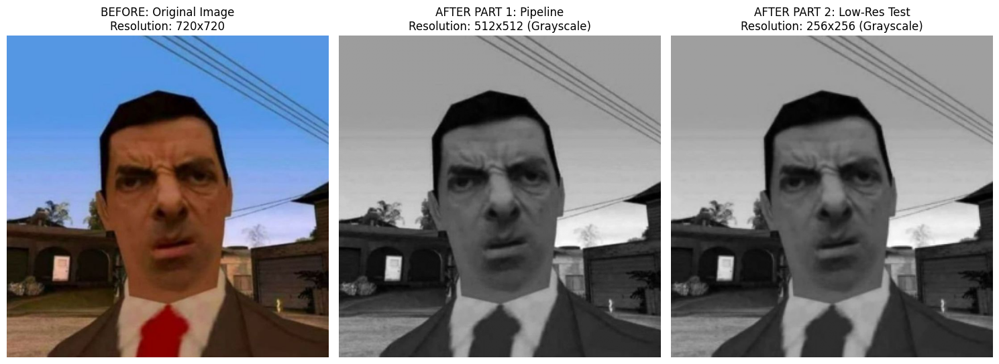

In [4]:
import cv2
import matplotlib.pyplot as plt
import glob
import os

# Point to your dataset folder
IMAGE_DIR = "/content/funny_images/"
image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))

if not image_paths:
    print("No images found! Make sure they are in /content/funny_images/")
else:
    # Grab the first image in the folder
    test_img_path = image_paths[0]

    # --- BEFORE (Original Image) ---
    original_bgr = cv2.imread(test_img_path)
    # OpenCV loads images in BGR format, but matplotlib expects RGB for correct colors
    original_rgb = cv2.cvtColor(original_bgr, cv2.COLOR_BGR2RGB)

    # --- AFTER PART 1 (Resized to 512x512 & Grayscale) ---
    resized_512 = cv2.resize(original_bgr, (512, 512))
    gray_512 = cv2.cvtColor(resized_512, cv2.COLOR_BGR2GRAY)

    # --- AFTER PART 2 (Resized to 256x256 & Grayscale) ---
    resized_256 = cv2.resize(original_bgr, (256, 256))
    gray_256 = cv2.cvtColor(resized_256, cv2.COLOR_BGR2GRAY)

    # --- Plotting the Comparison ---
    # Create a figure with 3 subplots side-by-side
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))

    # 1. Show Original
    axes[0].imshow(original_rgb)
    axes[0].set_title(f"BEFORE: Original Image\nResolution: {original_bgr.shape[1]}x{original_bgr.shape[0]}")
    axes[0].axis('off') # Hide gridlines and axes

    # 2. Show Part 1 Output
    # Note: We must specify cmap='gray' so matplotlib doesn't apply a fake color map
    axes[1].imshow(gray_512, cmap='gray')
    axes[1].set_title("AFTER PART 1: Pipeline\nResolution: 512x512 (Grayscale)")
    axes[1].axis('off')

    # 3. Show Part 2 Output
    axes[2].imshow(gray_256, cmap='gray')
    axes[2].set_title("AFTER PART 2: Low-Res Test\nResolution: 256x256 (Grayscale)")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

Generating comparisons for 15 images...



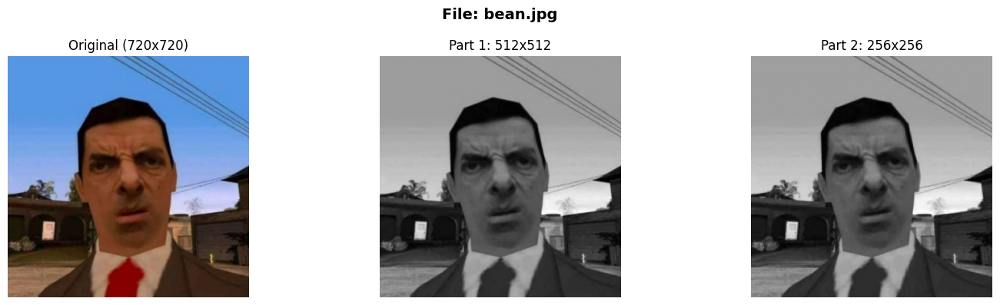

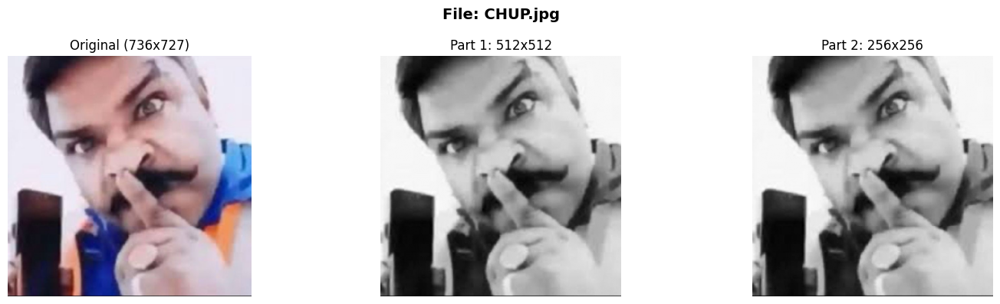

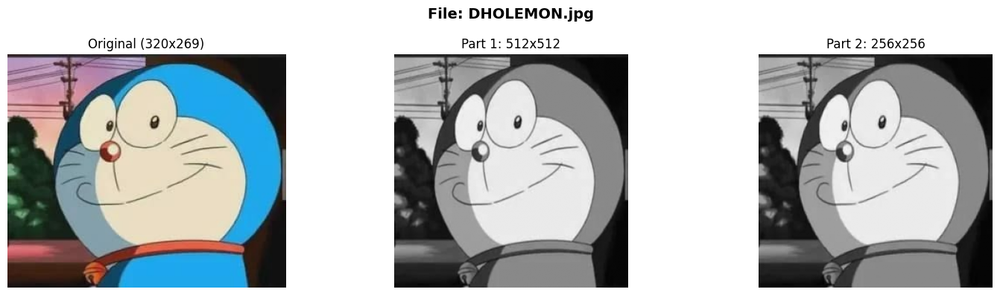

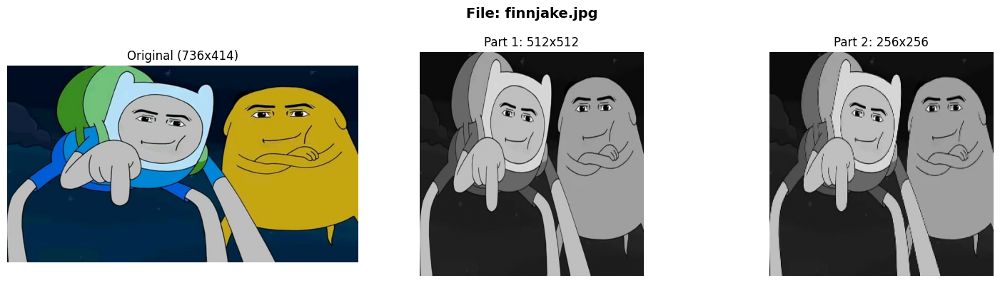

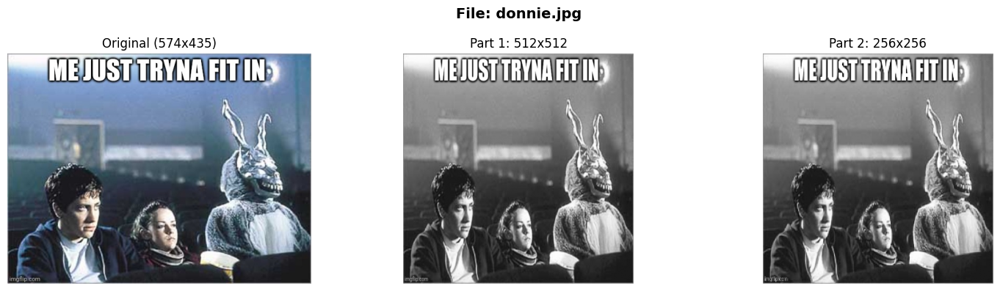

...

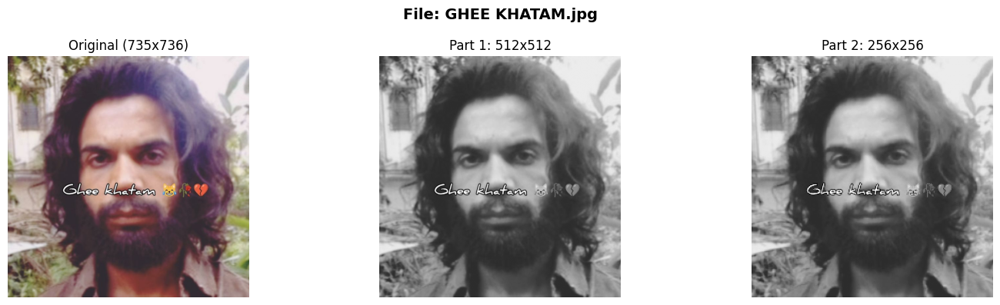

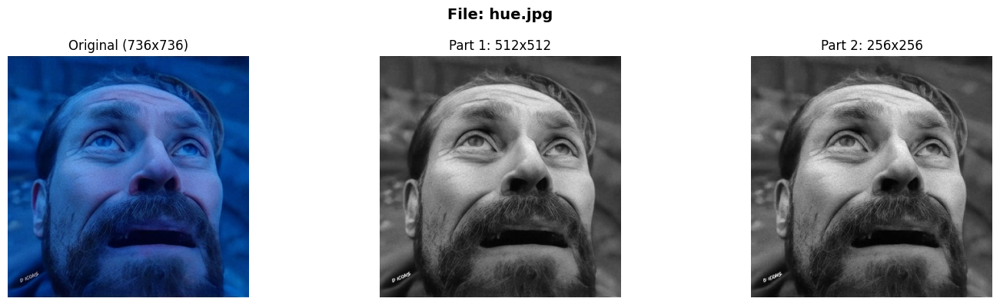

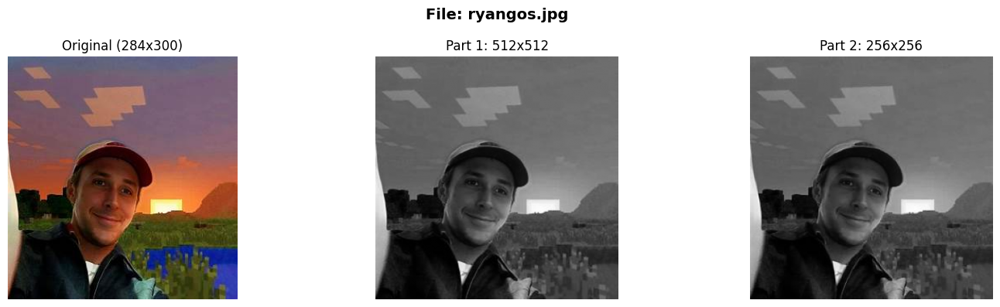

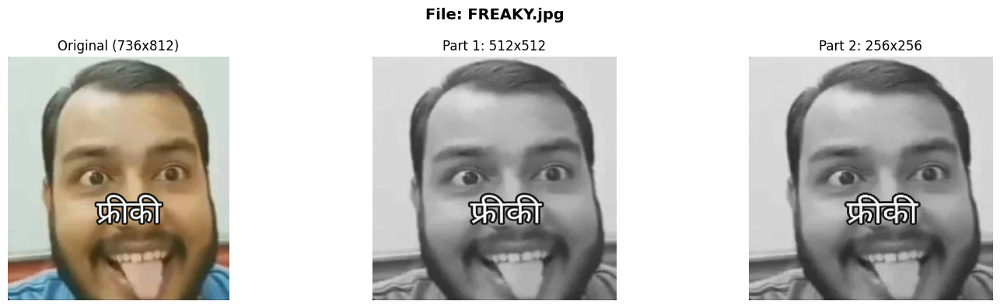

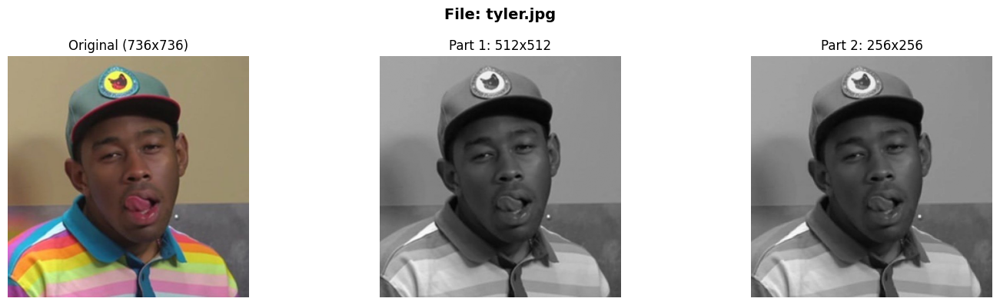

In [5]:
import cv2
import matplotlib.pyplot as plt
import glob
import os

# Point to your dataset folder
IMAGE_DIR = "/content/funny_images/"
# Grab up to 15 images to avoid crashing the browser with too many plots
image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))[:15]

if not image_paths:
    print("No images found! Make sure they are in /content/funny_images/")
else:
    print(f"Generating comparisons for {len(image_paths)} images...\n")

    # Loop through EVERY image in the list
    for img_path in image_paths:
        # Get the filename to use as a title
        filename = os.path.basename(img_path)

        # --- BEFORE (Original Image) ---
        original_bgr = cv2.imread(img_path)

        # Safety check: skip if OpenCV failed to read the file
        if original_bgr is None:
            continue

        original_rgb = cv2.cvtColor(original_bgr, cv2.COLOR_BGR2RGB)

        # --- AFTER PART 1 (Resized to 512x512 & Grayscale) ---
        resized_512 = cv2.resize(original_bgr, (512, 512))
        gray_512 = cv2.cvtColor(resized_512, cv2.COLOR_BGR2GRAY)

        # --- AFTER PART 2 (Resized to 256x256 & Grayscale) ---
        resized_256 = cv2.resize(original_bgr, (256, 256))
        gray_256 = cv2.cvtColor(resized_256, cv2.COLOR_BGR2GRAY)

        # --- Plotting the Comparison ---
        # Create a figure for this specific image
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))

        # Add the filename as a bold title centered above the 3 images
        fig.suptitle(f"File: {filename}", fontsize=14, fontweight='bold')

        # 1. Show Original
        axes[0].imshow(original_rgb)
        axes[0].set_title(f"Original ({original_bgr.shape[1]}x{original_bgr.shape[0]})")
        axes[0].axis('off')

        # 2. Show Part 1 Output
        axes[1].imshow(gray_512, cmap='gray')
        axes[1].set_title("Part 1: 512x512")
        axes[1].axis('off')

        # 3. Show Part 2 Output
        axes[2].imshow(gray_256, cmap='gray')
        axes[2].set_title("Part 2: 256x256")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show() # This renders the current row before looping to the next image

The YCbCr color space is fundamentally used in JPEG compression because it perfectly exploits the biological limitations of the human eye. Human vision is incredibly sensitive to variations in brightness (Luminance, the Y channel) but is much less sensitive to fine details in color (Chrominance, the Cb and Cr channels). By transforming the image from RGB into YCbCr, the JPEG algorithm can apply a technique called chroma subsampling. This aggressively compresses and throws away a large amount of the color data (Cb and Cr) while leaving the brightness (Y) untouched, significantly reducing the file size without causing a noticeable drop in perceived image quality.
Conversion to RGB is performed only after the Inverse Discrete Cosine Transform (IDCT) during decoding because of how the compression math works. During encoding, the DCT (Discrete Cosine Transform) and quantization steps were mathematically applied directly to the individual Y, Cb, and Cr frequency blocks. Therefore, during decompression, the IDCT must run first to reverse those frequencies back into a spatial grid of physical YCbCr pixels. You cannot mathematically convert frequency-domain waves directly into RGB colors; you must fully reconstruct the spatial YCbCr image first, and only then apply the final matrix multiplication (like Y = 0.299R + 0.587G + 0.114B) to map those values back to the RGB color space required by computer monitors.

Q3

In [7]:
!pip install nvidia-dali-cuda110

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.0/153.0 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.2/28.2 MB 76.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.5/20.5 MB 78.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 104.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 91.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 89.1 MB/s eta 0:00:00
  Created wheel for nvidia-dali-cuda110: filename=nvidia_dali_cuda110-1.50.0-py3-none-manylinux2014_x86_64.whl size=547328034 sha256=c80237a529ea76b73d6b176918d2e278ff29f89c884c0e1dde185c952511497d
  Stored in directory: /root/.cache/pip/wheels/09/c3/8b/2c8af84dcba61bf6d638668b9761dea6817c3394e8b45c1c7d
Successfull

Metric               | Hybrid Pipeline A    | DALI Pipeline B     
-----------------------------------------------------------------
Total Time           | 0.3601 s                   | 0.3887 s
Throughput           | 41.66 img/s             | 38.59 img/s


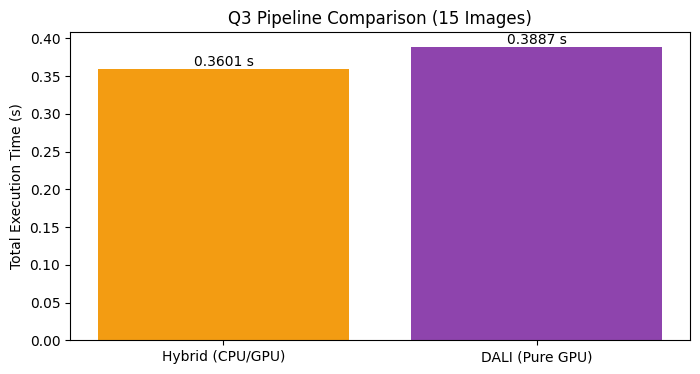

In [2]:
import time
import os
import glob
import cv2
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

try:
    from nvidia.dali.pipeline import Pipeline
    import nvidia.dali.fn as fn
    import nvidia.dali.types as types
    DALI_AVAILABLE = True
except ImportError:
    print("NVIDIA DALI not installed. We will skip the DALI execution, but Hybrid will still run.")
    DALI_AVAILABLE = False

IMAGE_DIR = "/content/funny_images/"
image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))

# Q3 requires at least 20 images, but we will use whatever you have available
NUM_IMAGES = len(image_paths)
BATCH_SIZE = 16

def build_dali_pipeline(paths_list, batch_size):
    """Pipeline B: DALI-Based Approach (All GPU)"""
    pipe = Pipeline(batch_size=batch_size, num_threads=4, device_id=0)
    with pipe:
        # FIX: We use 'files=paths_list' instead of 'file_root'
        # This forces DALI to read exactly the files we tell it to
        jpegs, labels = fn.readers.file(files=paths_list)

        # 2. Perform GPU-based decoding (nvJPEG internally)
        images = fn.decoders.image(jpegs, device="mixed", output_type=types.RGB)

        # 3. Apply resizing and normalization on GPU
        resized = fn.resize(images, resize_x=256, resize_y=256)
        normalized = fn.crop_mirror_normalize(
            resized,
            mean=[0.485*255, 0.456*255, 0.406*255],
            std=[0.229*255, 0.224*255, 0.225*255]
        )
        pipe.set_outputs(normalized)
    return pipe

if NUM_IMAGES > 0:
    # Run Hybrid Pipeline
    hybrid_time = pipeline_a_hybrid(image_paths)
    hybrid_throughput = NUM_IMAGES / hybrid_time

    # Run DALI Pipeline
    dali_time = 0
    dali_throughput = 0
    if DALI_AVAILABLE:
        # FIX: Pass 'image_paths' instead of 'IMAGE_DIR'
        dali_pipe = build_dali_pipeline(image_paths, NUM_IMAGES)
        dali_pipe.build()
        start_dali = time.time()
        dali_out = dali_pipe.run()
        torch.cuda.synchronize()
        dali_time = time.time() - start_dali
        dali_throughput = NUM_IMAGES / dali_time

    # --- Print Tabular Results ---
    print(f"{'Metric':<20} | {'Hybrid Pipeline A':<20} | {'DALI Pipeline B':<20}")
    print("-" * 65)
    print(f"{'Total Time':<20} | {hybrid_time:.4f} s{'':<18} | {dali_time:.4f} s")
    print(f"{'Throughput':<20} | {hybrid_throughput:.2f} img/s{'':<12} | {dali_throughput:.2f} img/s")

    # --- Present Results Using Graphs ---
    labels = ['Hybrid (CPU/GPU)', 'DALI (Pure GPU)']
    times = [hybrid_time, dali_time]

    plt.figure(figsize=(8, 4))
    bars = plt.bar(labels, times, color=['#f39c12', '#8e44ad'])
    plt.ylabel('Total Execution Time (s)')
    plt.title(f'Q3 Pipeline Comparison ({NUM_IMAGES} Images)')
    plt.bar_label(bars, fmt='%.4f s')
    plt.show()
else:
    print("No images found in the directory.")

Generating Normalization Comparisons for 15 images...



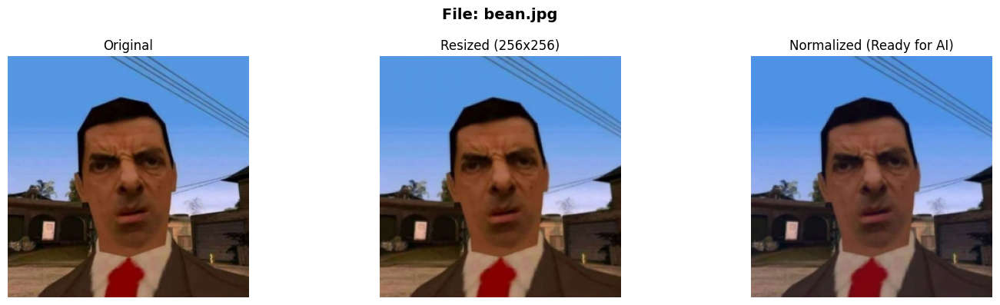

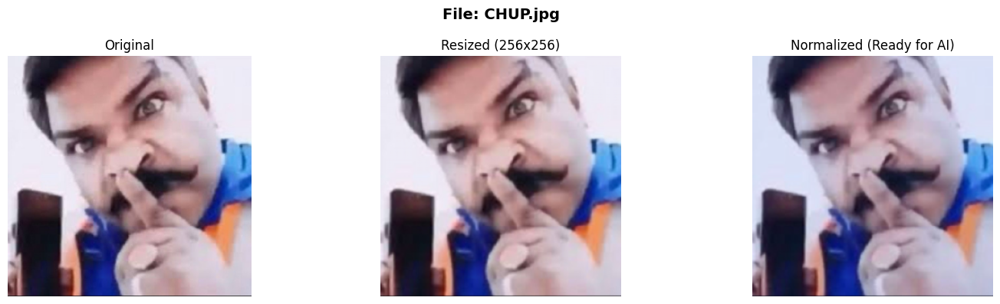

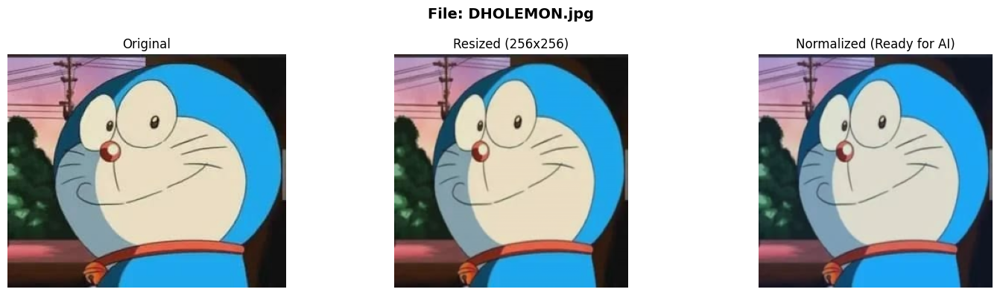

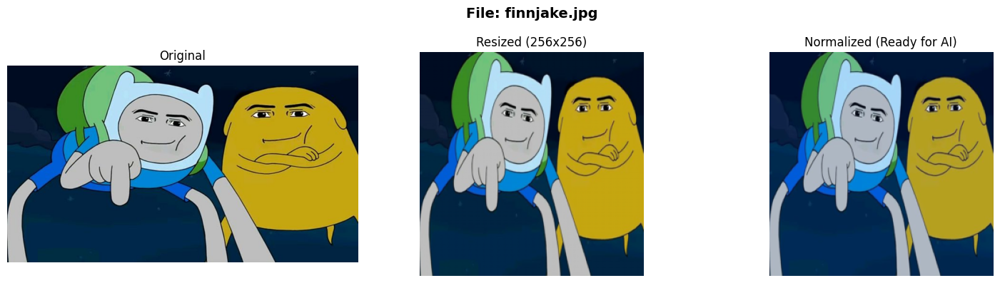

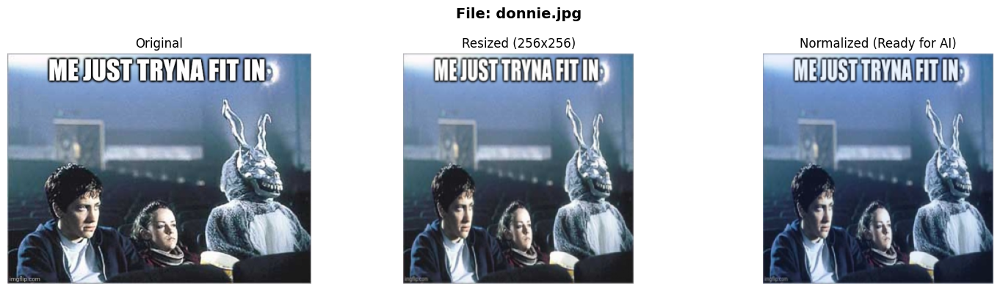

...

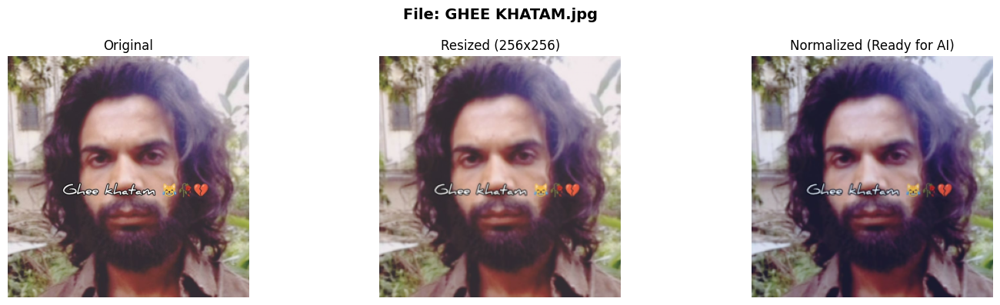

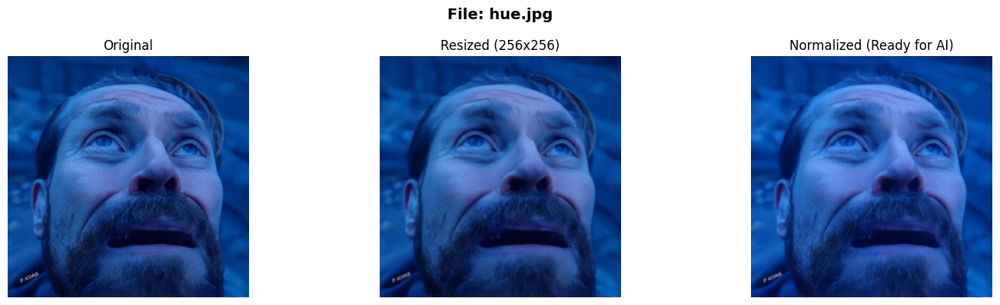

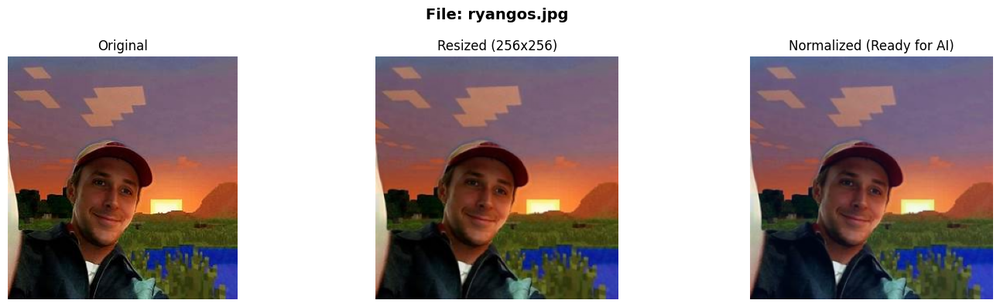

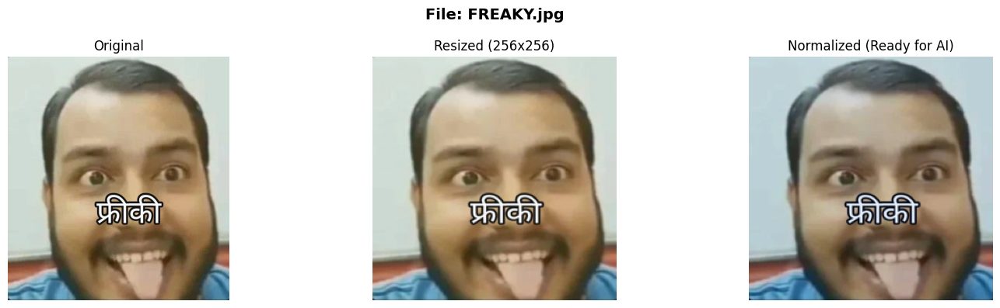

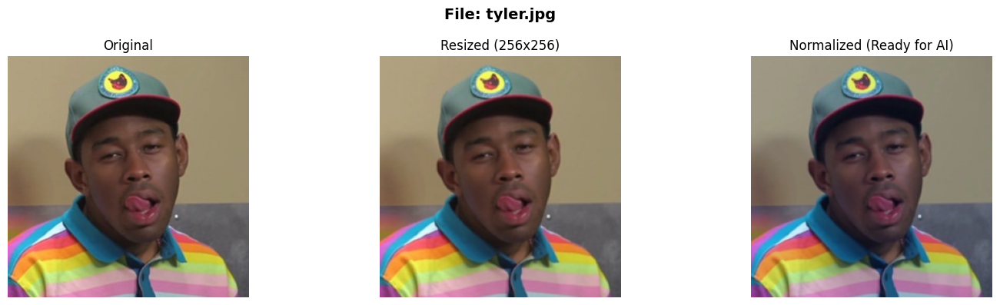

In [3]:
import numpy as np

# Limit to 20 images to match the Q3 dataset requirement and prevent crashing
eval_paths = image_paths[:20]

print(f"Generating Normalization Comparisons for {len(eval_paths)} images...\n")

# Same transforms used in the Hybrid pipeline
resize = transforms.Resize((256, 256))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

for path in eval_paths:
    filename = os.path.basename(path)

    # 1. Load Original
    img_bgr = cv2.imread(path)
    if img_bgr is None: continue
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # 2. Process via Hybrid steps
    img_tensor = torch.from_numpy(img_rgb).permute(2, 0, 1).float() / 255.0
    img_resized = resize(img_tensor)
    img_normalized = normalize(img_resized)

    # Convert tensors back to numpy for matplotlib
    # To view the normalized tensor, we must clip values between 0 and 1
    # because normalization creates negative numbers that matplotlib can't plot natively
    display_resized = img_resized.permute(1, 2, 0).numpy()
    display_normalized = img_normalized.permute(1, 2, 0).numpy()

    # Scale normalized data to [0, 1] purely for visualization purposes
    display_normalized = (display_normalized - display_normalized.min()) / (display_normalized.max() - display_normalized.min())

    # --- Plotting ---
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    fig.suptitle(f"File: {filename}", fontsize=14, fontweight='bold')

    axes[0].imshow(img_rgb)
    axes[0].set_title(f"Original")
    axes[0].axis('off')

    axes[1].imshow(display_resized)
    axes[1].set_title("Resized (256x256)")
    axes[1].axis('off')

    axes[2].imshow(display_normalized)
    axes[2].set_title("Normalized (Ready for AI)")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

In [4]:
import os
import urllib.request
import tarfile
import glob
import shutil

# Paths
url = "https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz"
download_path = "/content/pets_images.tar.gz"
extract_dir = "/content/oxford_pets/"
REAL_1500_DIR = "/content/unique_1500_images/"

print("Downloading real dataset (this might take a minute)...")
if not os.path.exists(download_path):
    urllib.request.urlretrieve(url, download_path)

print("Extracting images...")
if not os.path.exists(extract_dir):
    with tarfile.open(download_path, "r:gz") as tar:
        tar.extractall(path=extract_dir)

# Create the final folder for our 1500 images
os.makedirs(REAL_1500_DIR, exist_ok=True)

# Grab all the extracted JPEGs
all_real_images = glob.glob(os.path.join(extract_dir, "images", "*.jpg"))

print(f"Found {len(all_real_images)} total images in the dataset.")
print("Selecting exactly 1500 unique images...")

# Slice exactly 1500 images
selected_images = all_real_images[:1500]

# Copy them to our clean folder
for img in selected_images:
    shutil.copy(img, REAL_1500_DIR)

final_paths = glob.glob(os.path.join(REAL_1500_DIR, "*.jpg"))
print(f"\nSuccess! You now have a folder with {len(final_paths)} separate, unique images.")
print(f"Your new dataset is located at: {REAL_1500_DIR}")

Extracting images...


/tmp/ipykernel_7329/1409990803.py:20: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=extract_dir)


Found 7390 total images in the dataset.
Selecting exactly 1500 unique images...

Success! You now have a folder with 1500 separate, unique images.
Your new dataset is located at: /content/unique_1500_images/


In [5]:
import time
import glob
import os
import cv2
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

# DALI setup
try:
    from nvidia.dali.pipeline import Pipeline
    import nvidia.dali.fn as fn
    import nvidia.dali.types as types
    DALI_AVAILABLE = True
except ImportError:
    print("Please make sure DALI is installed!")
    DALI_AVAILABLE = False

# Pointing to your newly created folder with 1500 images!
IMAGE_DIR = "/content/unique_1500_images/"
massive_image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))
NUM_IMAGES = len(massive_image_paths)

print(f"Benchmarking Pipelines on {NUM_IMAGES} images...")

BATCH_SIZE = 32

# --- 1. Hybrid Pipeline (CPU -> GPU) ---
def hybrid_massive_test(paths):
    start_time = time.time()
    resize = transforms.Resize((256, 256))
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    for path in paths:
        img = cv2.imread(path)
        if img is None: continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_tensor = torch.from_numpy(img_rgb).cuda().permute(2, 0, 1).float() / 255.0

        img_resized = resize(img_tensor)
        img_normalized = normalize(img_resized)

    torch.cuda.synchronize()
    return time.time() - start_time

# --- 2. DALI Pipeline (Pure GPU) ---
def build_dali_pipeline(paths_list, batch_size):
    pipe = Pipeline(batch_size=batch_size, num_threads=4, device_id=0)
    with pipe:
        jpegs, labels = fn.readers.file(files=paths_list)
        images = fn.decoders.image(jpegs, device="mixed", output_type=types.RGB)
        resized = fn.resize(images, resize_x=256, resize_y=256)
        normalized = fn.crop_mirror_normalize(
            resized,
            mean=[0.485*255, 0.456*255, 0.406*255],
            std=[0.229*255, 0.224*255, 0.225*255]
        )
        pipe.set_outputs(normalized)
    return pipe

# --- 3. Run the Benchmark ---
print("Running Hybrid Pipeline...")
hybrid_time = hybrid_massive_test(massive_image_paths)
hybrid_throughput = NUM_IMAGES / hybrid_time

dali_time = 0
dali_throughput = 0

if DALI_AVAILABLE:
    print("Running DALI Pipeline...")
    dali_pipe = build_dali_pipeline(massive_image_paths, BATCH_SIZE)
    dali_pipe.build()

    num_batches = NUM_IMAGES // BATCH_SIZE

    start_dali = time.time()
    for _ in range(num_batches):
        dali_out = dali_pipe.run()
    torch.cuda.synchronize()
    dali_time = time.time() - start_dali

    images_processed_dali = num_batches * BATCH_SIZE
    dali_throughput = images_processed_dali / dali_time

# --- 4. Print & Graph Results ---
print("\n" + "="*60)
print(f"{'Metric':<20} | {'Hybrid (PyTorch)':<18} | {'DALI Pipeline':<18}")
print("-" * 60)
print(f"{'Total Time':<20} | {hybrid_time:.4f} s{'':<8} | {dali_time:.4f} s")
print(f"{'Throughput':<20} | {hybrid_throughput:.2f} img/s{'':<3} | {dali_throughput:.2f} img/s")
print("="*60 + "\n")

plt.figure(figsize=(8, 5))
bars = plt.bar(['Hybrid (CPU/GPU)', 'DALI (Pure GPU)'],
               [hybrid_throughput, dali_throughput],
               color=['#f39c12', '#8e44ad'])
plt.ylabel('Throughput (Images per Second)')
plt.title(f'Q3 Pipeline Comparison on Real Dataset ({NUM_IMAGES} Images)\nHigher is Better!')
plt.bar_label(bars, fmt='%.1f imgs/s')
plt.show()

Benchmarking Pipelines on 1500 images...
Running Hybrid Pipeline...
Running DALI Pipeline...


RuntimeError: Critical error in pipeline:
Error in MIXED operator `nvidia.dali.fn.decoders.image`,
which was used in the pipeline definition with the following traceback:

  File "/tmp/ipykernel_7329/1454816829.py", line 51, in build_dali_pipeline
    images = fn.decoders.image(jpegs, device="mixed", output_type=types.RGB)

encountered:

Error in thread 0: GIF images are not supported.. File: /content/unique_1500_images/Egyptian_Mau_145.jpg
Current pipeline object is no longer valid.

In [6]:
from PIL import Image
import glob
import os

IMAGE_DIR = "/content/unique_1500_images/"
image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))

print(f"Scanning {len(image_paths)} files for fake JPEGs...")
removed_count = 0

for path in image_paths:
    try:
        # Open the image with PIL to check its true internal format
        with Image.open(path) as img:
            if img.format != 'JPEG':
                print(f"Kicking out {os.path.basename(path)} (Actual format: {img.format})")
                os.remove(path)
                removed_count += 1
    except Exception as e:
        # If the file is completely corrupted and won't even open, delete it too
        print(f"Kicking out corrupted file: {os.path.basename(path)}")
        os.remove(path)
        removed_count += 1

remaining = len(image_paths) - removed_count
print(f"\nCleanup complete! Removed {removed_count} problematic images.")
print(f"You now have {remaining} pure, clean JPEGs ready for DALI.")

Scanning 1500 files for fake JPEGs...
Kicking out Egyptian_Mau_145.jpg (Actual format: GIF)
Kicking out Abyssinian_34.jpg (Actual format: GIF)

Cleanup complete! Removed 2 problematic images.
You now have 1498 pure, clean JPEGs ready for DALI.


Benchmarking Pipelines on 1498 clean images...
Running Hybrid Pipeline... (This might take a few seconds)
Running DALI Pipeline... (Watch it fly)

Metric               | Hybrid (PyTorch)   | DALI Pipeline     
------------------------------------------------------------
Total Time           | 6.1668 s         | 2.7093 s
Throughput           | 242.91 img/s    | 543.30 img/s



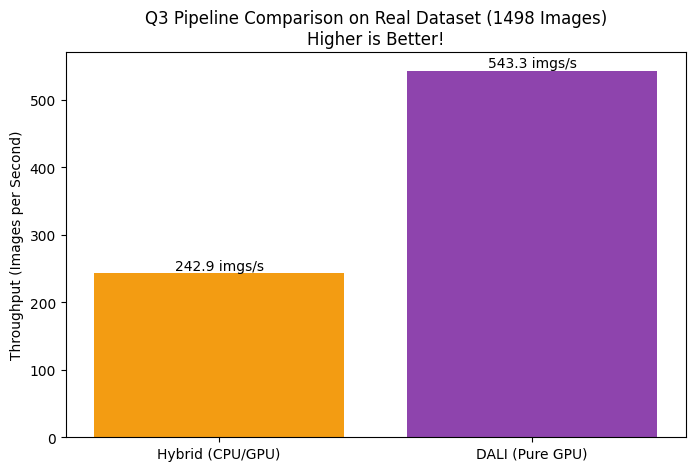

In [7]:
import time
import glob
import os
import cv2
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

# DALI setup
try:
    from nvidia.dali.pipeline import Pipeline
    import nvidia.dali.fn as fn
    import nvidia.dali.types as types
    DALI_AVAILABLE = True
except ImportError:
    print("Please make sure DALI is installed!")
    DALI_AVAILABLE = False

# Pointing to your cleaned folder
IMAGE_DIR = "/content/unique_1500_images/"
massive_image_paths = glob.glob(os.path.join(IMAGE_DIR, "*.jpg"))
NUM_IMAGES = len(massive_image_paths)

print(f"Benchmarking Pipelines on {NUM_IMAGES} clean images...")

BATCH_SIZE = 32

# --- 1. Hybrid Pipeline (CPU -> GPU) ---
def hybrid_massive_test(paths):
    start_time = time.time()
    resize = transforms.Resize((256, 256))
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    for path in paths:
        img = cv2.imread(path)
        if img is None: continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_tensor = torch.from_numpy(img_rgb).cuda().permute(2, 0, 1).float() / 255.0

        img_resized = resize(img_tensor)
        img_normalized = normalize(img_resized)

    torch.cuda.synchronize()
    return time.time() - start_time

# --- 2. DALI Pipeline (Pure GPU) ---
def build_dali_pipeline(paths_list, batch_size):
    pipe = Pipeline(batch_size=batch_size, num_threads=4, device_id=0)
    with pipe:
        jpegs, labels = fn.readers.file(files=paths_list)
        images = fn.decoders.image(jpegs, device="mixed", output_type=types.RGB)
        resized = fn.resize(images, resize_x=256, resize_y=256)
        normalized = fn.crop_mirror_normalize(
            resized,
            mean=[0.485*255, 0.456*255, 0.406*255],
            std=[0.229*255, 0.224*255, 0.225*255]
        )
        pipe.set_outputs(normalized)
    return pipe

# --- 3. Run the Benchmark ---
if NUM_IMAGES > 0:
    print("Running Hybrid Pipeline... (This might take a few seconds)")
    hybrid_time = hybrid_massive_test(massive_image_paths)
    hybrid_throughput = NUM_IMAGES / hybrid_time

    dali_time = 0
    dali_throughput = 0

    if DALI_AVAILABLE:
        print("Running DALI Pipeline... (Watch it fly)")
        dali_pipe = build_dali_pipeline(massive_image_paths, BATCH_SIZE)
        dali_pipe.build()

        num_batches = NUM_IMAGES // BATCH_SIZE

        start_dali = time.time()
        for _ in range(num_batches):
            dali_out = dali_pipe.run()
        torch.cuda.synchronize()
        dali_time = time.time() - start_dali

        # Calculate exactly how many images were processed in full batches
        images_processed_dali = num_batches * BATCH_SIZE
        dali_throughput = images_processed_dali / dali_time

    # --- 4. Print & Graph Results ---
    print("\n" + "="*60)
    print(f"{'Metric':<20} | {'Hybrid (PyTorch)':<18} | {'DALI Pipeline':<18}")
    print("-" * 60)
    print(f"{'Total Time':<20} | {hybrid_time:.4f} s{'':<8} | {dali_time:.4f} s")
    print(f"{'Throughput':<20} | {hybrid_throughput:.2f} img/s{'':<3} | {dali_throughput:.2f} img/s")
    print("="*60 + "\n")

    plt.figure(figsize=(8, 5))
    bars = plt.bar(['Hybrid (CPU/GPU)', 'DALI (Pure GPU)'],
                   [hybrid_throughput, dali_throughput],
                   color=['#f39c12', '#8e44ad'])
    plt.ylabel('Throughput (Images per Second)')
    plt.title(f'Q3 Pipeline Comparison on Real Dataset ({NUM_IMAGES} Images)\nHigher is Better!')
    plt.bar_label(bars, fmt='%.1f imgs/s')
    plt.show()
else:
    print("No images found! Make sure the folder path is correct.")